# Excatly 1 Maze
 based on the problem: https://erich-friedman.github.io/puzzle/exactly1/
 
 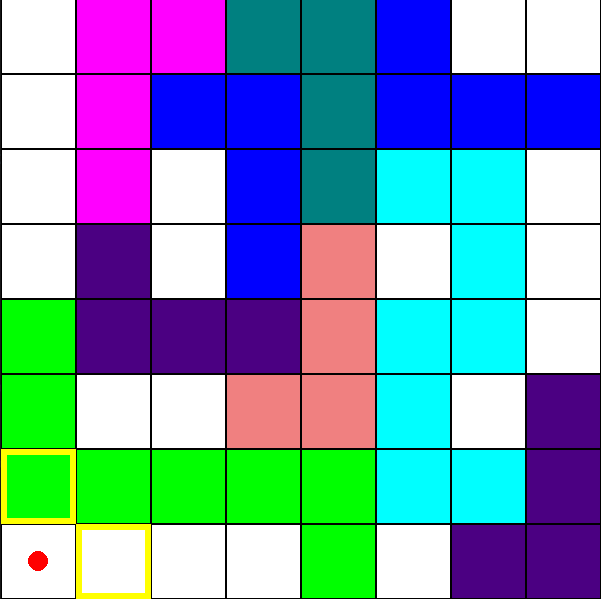
 
 
 importing libraries:

In [80]:
from gym import Env, spaces
from gym.spaces import Discrete
from structures import Board
from utils import makeMove, operationConverter, possibleOperations
from screen import Screen
import numpy as np
from matplotlib import pyplot as plt

## Imporitng our custom gym enviroment

In [81]:
class ExactlyOneMazesEnv(Env):
    def __init__(self):

        #Actions: up, right, down, left
        self.action_space = Discrete(4)

        #Observation space of the problem
        self.observation_space = spaces.Discrete(10000)

        #Initial board
        self.state = Board([
            [5, 5, 5, 7, 7, 0],
            [0, 3, 5, 7, 6, 0],
            [0, 3, 0, 7, 6, 8],
            [0, 3, 3, 6, 6, 8],
            [0, 4, 4, 4, 8, 8],
            [1, 0, 0, 4, 0, 0],
        ])

        self.screen = Screen()
        self.screen.set_up(self.state.matrix)

        self.initial_l_figures = len(self.state.l_figures)

    def step(self, action):

        op = operationConverter(action)
        possible_ops = possibleOperations(self.state)
        done = False

        if (op in possible_ops):
            self.state = makeMove(self.state, operationConverter(action))

            # Next state is a won game
            if (self.state.gameOver()):
                reward = self.initial_l_figures * 100
            else:
                # Next state is a lost game
                if len(possibleOperations(self.state)) == 0:
                    reward = -1
                    done = True
                # Next state is a regular valid move
                else:
                    reward = self.initial_l_figures - len(self.state.l_figures)
                    print("reward at step = {}".format(reward))
        # Illegal move
        else:
            reward = -99

        info = {}

        # Return step information
        return self.state, reward, done, info

    def render(self):
        self.screen.draw_board(self.state.matrix, possibleOperations(self.state))

    def reset(self):
        #Reset board
        self.state.restart()

        return self.state

    def print(self):
        self.state.print()

a = ExactlyOneMazesEnv()


## Setting up
We set up the env with the custom class


In [82]:
env = ExactlyOneMazesEnv()
state = env.reset()
env.render()

Restarting...


We startup the Q table and the learning parameters

In [83]:
alpha = 0.7         #Learning rate
gamma = 0.618       #Discount rate
epsilon = 1         #Exploration rate
max_epsilon = 1     #Exploration probability at start
min_epsilon = 0.01  #Minimum exploration probability
decay = 0.01        #Exponential decay rate for exploration prob

train_episodes = 2000
test_episodes = 100
max_steps = 100

Q = np.zeros((env.observation_space.n, env.action_space.n))

## Q learning training algorithm:

In [87]:
#Training the agent

training_rewards = []
epsilons = []  

for episode in range(train_episodes):
    # Reseting the environment each time as per requirement
    state = env.reset()
    # Starting the tracker for the rewards
    total_training_rewards = 0

    for step in range(100):
        # Choosing an action given the states based on a random number
        exp_exp_tradeoff = random.uniform(0, 1)

        if exp_exp_tradeoff > epsilon:
            action = np.argmax(Q[state.get_obs(), :])
        else:
            action = env.action_space.sample()

        new_state, reward, done, info = env.step(action)

        Q[state.get_obs(), action] = Q[state.get_obs(), action] + alpha * (
                    reward + gamma * np.max(Q[new_state.get_obs(), :]) - Q[state.get_obs(), action])

        total_training_rewards += reward
        state = new_state

        env.render()
        state.print()
        print("Reward: ", reward, "\n")

        if done == True:
            # print ("Total reward for episode {}: {}".format(episode, total_training_rewards))
            break

    # Cutting down on exploration by reducing the epsilon
    epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay * episode)

    # Adding the total reward and reduced epsilon values
    training_rewards.append(total_training_rewards)
    epsilons.append(epsilon)

print("Training score over time: " + str(sum(training_rewards) / train_episodes))

Restarting...
reward at step = 0
5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
1 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

reward at step = 0
5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
1 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

reward at step = 0
5 5 5 7 7 0  
0 3 5 7 6 0  
1 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

reward at step = 0
5 5 5 7 7 0  
1 3 5 7 6 0  
2 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

1 5 5 7 7 0  
2 3 5 7 6 0  
2 3 0 7 6 8  
2 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -1 

Restarting...
reward at step = 0
5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
1 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  0 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
1 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -99 

5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
0 3 3 6 6 8  
1 4 4 4 8 8  
2 0 0 4 0 0  
Reward:  -99 

reward at step = 0
5 5 5 7 7 0  
0 3 5 7 6 0  
0 3 0 7 6 8  
1 3 3 6 6 8  
2 4 4 4 8 8  
2 0 0 4

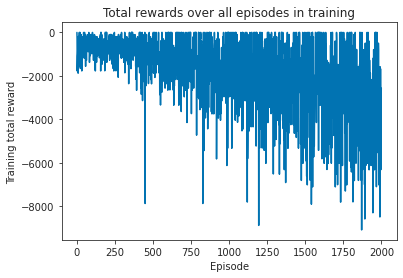

In [89]:
x = range(train_episodes)
plt.plot(x, training_rewards)
plt.xlabel('Episode')
plt.ylabel('Training total reward')
plt.title('Total rewards over all episodes in training') 
plt.show()

In [ ]:
total_epochs, total_penalties = 0, 0
episodes = 100

state = env.reset()
epochs, penalties, reward = 0, 0, 0

done = False

while not done:
    env.render()
    action = np.argmax(Q[state.get_obs()])
    state, reward, done, info = env.step(action)
    print("state = {}, action = {}".format(state.get_obs(), action))
    if reward == -10:
        penalties += 1
    epochs += 1
total_penalties += penalties
total_epochs += epochs


print(f"Results after {episodes} episodes:")
print(f"Average timesteps per episode: {total_epochs / episodes}")
print(f"Average penalties per episode: {total_penalties / episodes}")


Restarting...
reward at step = 0
state = 2381, action = 0
reward at step = 1
state = 9510, action = 1
reward at step = 2
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
state = 1455, action = 0
stat

KeyboardInterrupt: 

## SARSA
Useful functions

In [ ]:
def chose_action(state):
    action=0
    if np.random.uniform(0, 1) < epsilon:
        action = env.action_space.sample()
    else:
        action = np.argmax(Q[state.get_obs(), :])
    return action

#Function to learn the Q-value
def update(state, state2, reward, action, action2):
    predict = Q[state.get_obs(), action]
    target = reward + gamma * Q[state2.get_obs(), action2]
    Q[state.get_obs(), action] = Q[state.get_obs(), action] + alpha * (target - predict)

### SARSA training algorithm:

In [ ]:
#Training the agent

#Creating lists to keep track of reward and epsilon values
training_rewards = []
epsilons = []

reward = 0
for episode in range(train_episodes):
    t = 0
    state1 = env.reset()
    action1 = chose_action(state1)

    for step in range(max_steps):
        env.render()

        state2, reward, done, info = env.step(action1)

        action2 = chose_action(state2)

        update(state1, state2, reward, action1, action2)

        state1 = state2
        action1 = action2

        state1.print()
        print("Reward: ", reward, "\n")

        reward += 1

        # Ending the episode
        if done == True:
            # print ("Total reward for episode {}: {}".format(episode, total_training_rewards))
            break

rewardEpisodes = "{:.3f}".format(reward/train_episodes)
print("reward/episodes = ", reward, "/", train_episodes, " = ", rewardEpisodes)

print(Q)